In [1]:
import pandas as pd
import numpy as np
import time
import os
import glob
import json
from sklearn.metrics import mean_absolute_error, mean_squared_error, r2_score
from sklearn.ensemble import RandomForestRegressor
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from collections import defaultdict
import matplotlib.pyplot as plt

## Configuration

In [7]:
# Directory where the derived data is stored
DERIVED_DATA_DIR = '../../../../data'

# Number of force cells in the robotic leg
N_CELLS = 8

pd.set_option('display.max_columns', None)

# Prediction of the data from the same experiment 

Check that a basic prediction can be done. The aim of this sanity check is to ensure that the correlation between the data in the same experiment is enough to produce quality predictions. In this case, we are going to check if in the same experiment, we can predict the last 30% of the experiment training the model with the first 70%.

In [3]:
H3_LEG = 'L' # L|R

features = [H3_LEG + a + m for a in ['Hip', 'Knee'] for m in ['Pos', 'Torque']]
targets = ['F' + str(i + 1) + ax for i in range(N_CELLS) for ax in ['x', 'y', 'z']]

print('Number of features: {}'.format(len(features)))
print('Selected features: {}'.format(features))
print('\n')
print('Number of targets: {}'.format(len(targets)))
print('Selected targets: {}'.format(targets))

Number of features: 4
Selected features: ['LHipPos', 'LHipTorque', 'LKneePos', 'LKneeTorque']


Number of targets: 24
Selected targets: ['F1x', 'F1y', 'F1z', 'F2x', 'F2y', 'F2z', 'F3x', 'F3y', 'F3z', 'F4x', 'F4y', 'F4z', 'F5x', 'F5y', 'F5z', 'F6x', 'F6y', 'F6z', 'F7x', 'F7y', 'F7z', 'F8x', 'F8y', 'F8z']


In [4]:
# Scaler to normalize the data
SCALER = MinMaxScaler() # StandardScaler()

# Percentage of the date for the test set
TEST_SIZE = 0.3

In [31]:
experiments_dirs_path = glob.glob(DERIVED_DATA_DIR + '/*/*')
exp_path = experiments_dirs_path[10]

print('Experiment: ' + exp_path)

Experiment: ../../../../data/19022021/1


In [32]:
# Load targets
targets_df = pd.read_csv(exp_path + '/force_cells_processed.csv')

# Load features
features_df = pd.read_csv(exp_path + '/H3_processed.csv')
# leg_df = pd.read_csv(exp_path + '/leg_processed.csv')
# features_df = pd.concat([exo_df, leg_df], axis=1)

# Drop first row to remove noise in the start of the data recording
targets_df = targets_df.iloc[1:]
features_df = features_df.iloc[1:]
# Drop null values
idx = features_df.notna().all(axis=1)
features_df = features_df.loc[idx]
targets_df = targets_df.loc[idx]
print('Droping {} data points by null features'.format(len(idx[idx == False])))

assert(len(features_df) == len(targets_df))
# Store the final array
targets_arr = targets_df[targets].values
features_arr = features_df[features].values

print('X: {}, Y: {}'.format(features_arr.shape, targets_arr.shape))

Droping 0 data points by null features
X: (17908, 4), Y: (17908, 24)


In [33]:
idx_split = int(targets_arr.shape[0] * (1 - TEST_SIZE))

X_train = features_arr[:idx_split, :]
X_test = features_arr[idx_split:, :]

Y_train = targets_arr[:idx_split, :]
Y_test = targets_arr[idx_split:, :]

print('Train -> X: {}, Y: {}'.format(X_train.shape, Y_train.shape))
print('Test -> X: {}, Y: {}'.format(X_test.shape, Y_test.shape))

Train -> X: (12535, 4), Y: (12535, 24)
Test -> X: (5373, 4), Y: (5373, 24)


In [34]:
s = SCALER.fit(X_train)

X_train = s.transform(X_train)
X_test = s.transform(X_test)

print('Train -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_train, axis=0), np.max(X_train, axis=0), np.mean(X_train, axis=0), np.std(X_train, axis=0)))
print('Test -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_test, axis=0), np.max(X_test, axis=0), np.mean(X_test, axis=0), np.std(X_test, axis=0)))

Train -> 
 min: [0. 0. 0. 0.], 
 max: [1. 1. 1. 1.], 
 mean: [0.43729711 0.33923612 0.21091736 0.46856447], 
 std: [0.33933627 0.21177887 0.29394099 0.21284523]

Test -> 
 min: [ 8.95691340e-04 -8.08506234e-03 -5.05591776e-05 -4.89992748e-03], 
 max: [0.99997707 1.01272075 1.00677817 0.97759504], 
 mean: [0.4467036  0.34740709 0.21892945 0.45074514], 
 std: [0.34137071 0.21752268 0.30088138 0.21394988]



In [35]:
# Setup the model
model = RandomForestRegressor(random_state=0, n_jobs=-1, verbose=0)

t_start = time.time()
model.fit(X_train, Y_train)
tr_time = time.time() - t_start
print('Training time: {:.4f}'.format(tr_time))

train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

results = {
    'Train': {
        'MAE': mean_absolute_error(Y_train, train_preds, multioutput='raw_values'),
        'MSE': mean_squared_error(Y_train, train_preds, multioutput='raw_values'),
        'R2': r2_score(Y_train, train_preds, multioutput='raw_values')
    },
    'Test': {
        'MAE': mean_absolute_error(Y_test, test_preds, multioutput='raw_values'),
        'MSE': mean_squared_error(Y_test, test_preds, multioutput='raw_values'),
        'R2': r2_score(Y_test, test_preds, multioutput='raw_values')
    }       
    
}

results_summary = {}
results_summary['Training time'] = tr_time
# Display the score mean and standard deviation of each axis
for subset in ['Train', 'Test']:
    for f, force in enumerate(['Fx', 'Fy', 'Fz']):
        for loss in ['MAE', 'MSE', 'R2']:
            scores = [results[subset][loss][i + f] for i in range(0, N_CELLS * 3, 3)]
            print(' '.join([subset, force, loss]) + ': {:.4f} ± {:.4f}'.format(np.mean(scores), np.std(scores)))
            results_summary[' '.join([subset, force, loss])] = '{:.4f} ± {:.4f}'.format(np.mean(scores), np.std(scores))
            


Training time: 1.7710
Train Fx MAE: 0.3154 ± 0.1061
Train Fx MSE: 0.3291 ± 0.1867
Train Fx R2: 0.9930 ± 0.0025
Train Fy MAE: 0.3959 ± 0.2216
Train Fy MSE: 0.6149 ± 0.5804
Train Fy R2: 0.9908 ± 0.0032
Train Fz MAE: 0.3467 ± 0.1122
Train Fz MSE: 0.3426 ± 0.1748
Train Fz R2: 0.9951 ± 0.0020
Test Fx MAE: 0.8568 ± 0.2274
Test Fx MSE: 1.5650 ± 0.8551
Test Fx R2: 0.9538 ± 0.0206
Test Fy MAE: 1.0524 ± 0.5860
Test Fy MSE: 3.1435 ± 3.0972
Test Fy R2: 0.9520 ± 0.0239
Test Fz MAE: 0.9138 ± 0.2877
Test Fz MSE: 1.8553 ± 1.0278
Test Fz R2: 0.9692 ± 0.0177


In [36]:
def plot_prediction(y_true, y_pred):
    '''
    
    '''
    n_samples = y_true.shape[0]
    
    # Plot the evolution of the forces
    plt.figure(figsize=(40,40))
    for idx, i in enumerate(range(0, (N_CELLS * 3), 3)):
        plt.subplot(4, 2, idx + 1)
        
        # Plot true values
        plt.plot(y_true[:, i], label='X true', c='r', linestyle='--')
        plt.plot(y_true[:, i + 1], label='Y true', c='g', linestyle='--')
        plt.plot(y_true[:, i + 2], label='Z true', c='b', linestyle='--')
        
        # Plot predicted values
        plt.plot(y_pred[:, i], label='X pred', c='r', alpha=0.6)
        plt.plot(y_pred[:, i + 1], label='Y pred', c='g', alpha=0.6)
        plt.plot(y_pred[:, i + 2], label='Z pred', c='b', alpha=0.6)
        
        plt.legend()
        plt.title('Cell {}'.format(str(idx + 1)))
        plt.ylabel('Force (N/m)')

    plt.show()

    return None

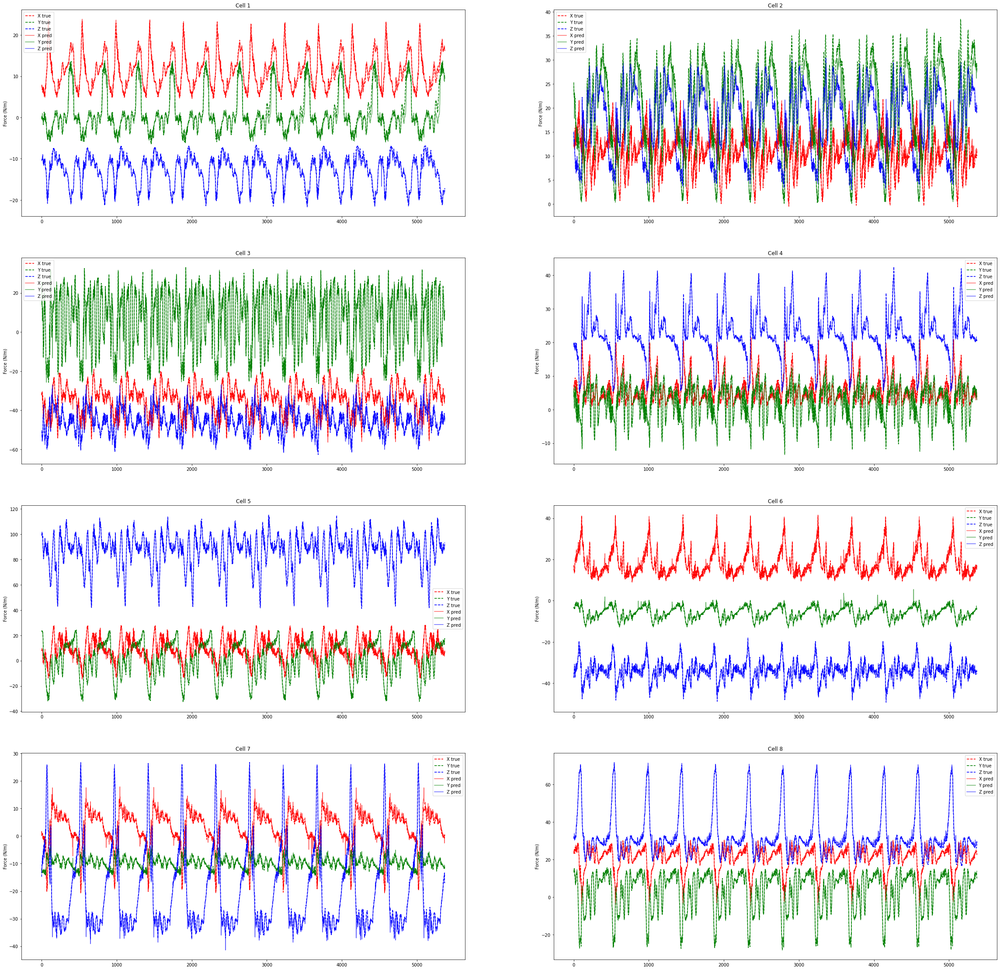

In [37]:
plot_prediction(Y_test, test_preds)

In [13]:
results_full = defaultdict(list)

for exp_path in experiments_dirs_path:
    print(exp_path)
    # Load targets
    targets_df = pd.read_csv(exp_path + '/force_cells_processed.csv')

    # Load features
    features_df = pd.read_csv(exp_path + '/H3_processed.csv')

    # Drop first row to remove noise in the start of the data recording
    targets_df = targets_df.iloc[1:]
    features_df = features_df.iloc[1:]
    # Drop null values
    idx = features_df.notna().all(axis=1)
    features_df = features_df.loc[idx]
    targets_df = targets_df.loc[idx]
    print('Droping {} data points by null features'.format(len(idx[idx == False])))

    assert(len(features_df) == len(targets_df))
    # Store the final array
    targets_arr = targets_df[targets].values
    features_arr = features_df[features].values

    print('X: {}, Y: {}'.format(features_arr.shape, targets_arr.shape))

    idx_split = int(targets_arr.shape[0] * (1 - TEST_SIZE))

    X_train = features_arr[:idx_split, :]
    X_test = features_arr[idx_split:, :]

    Y_train = targets_arr[:idx_split, :]
    Y_test = targets_arr[idx_split:, :]

    print('Train -> X: {}, Y: {}'.format(X_train.shape, Y_train.shape))
    print('Test -> X: {}, Y: {}'.format(X_test.shape, Y_test.shape))

    s = SCALER.fit(X_train)

    X_train = s.transform(X_train)
    X_test = s.transform(X_test)

    print('Train -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_train, axis=0), np.max(X_train, axis=0), np.mean(X_train, axis=0), np.std(X_train, axis=0)))
    print('Test -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_test, axis=0), np.max(X_test, axis=0), np.mean(X_test, axis=0), np.std(X_test, axis=0)))

    # Setup the model
    model = RandomForestRegressor(random_state=0, n_jobs=-1, verbose=0)

    t_start = time.time()
    model.fit(X_train, Y_train)
    tr_time = time.time() - t_start
    print('Training time: {:.4f}'.format(tr_time))

    train_preds = model.predict(X_train)
    test_preds = model.predict(X_test)

    results = {
        'Train': {
            'MAE': mean_absolute_error(Y_train, train_preds, multioutput='raw_values'),
            'MSE': mean_squared_error(Y_train, train_preds, multioutput='raw_values'),
            'R2': r2_score(Y_train, train_preds, multioutput='raw_values')
        },
        'Test': {
            'MAE': mean_absolute_error(Y_test, test_preds, multioutput='raw_values'),
            'MSE': mean_squared_error(Y_test, test_preds, multioutput='raw_values'),
            'R2': r2_score(Y_test, test_preds, multioutput='raw_values')
        }       

    }

    results_summary = {}
    results_summary['Training time'] = tr_time
    # Display the score mean and standard deviation of each axis
    for subset in ['Train', 'Test']:
        for f, force in enumerate(['Fx', 'Fy', 'Fz']):
            for loss in ['MAE', 'MSE', 'R2']:
                scores = [results[subset][loss][i + f] for i in range(0, N_CELLS * 3, 3)]
                s_mean = np.mean(scores)
                s_std = np.std(scores)
                
                print(' '.join([subset, force, loss]) + ': {:.4f} ± {:.4f}'.format(s_mean, s_std))
                results_summary[' '.join([subset, force, loss])] = '{:.4f} ± {:.4f}'.format(s_mean, s_std)
                
                results_full[' '.join([subset, force, loss])].append(s_mean)

    print('\n')

../../../data/10032021/1
Droping 2 data points by null features
X: (6072, 4), Y: (6072, 24)
Train -> X: (4251, 4), Y: (4251, 24)
Test -> X: (1821, 4), Y: (1821, 24)
Train -> 
 min: [0. 0. 0. 0.], 
 max: [1. 1. 1. 1.], 
 mean: [0.43460795 0.4028391  0.22404348 0.45510021], 
 std: [0.33853871 0.23908632 0.29838709 0.27007675]

Test -> 
 min: [1.14338908e-03 1.44560816e-02 4.80148601e-06 2.47788203e-03], 
 max: [0.99984536 1.01702033 0.99921221 1.00004503], 
 mean: [0.44575618 0.40768544 0.23334027 0.44694299], 
 std: [0.34346745 0.24434585 0.30538404 0.27623816]

Training time: 0.5279
Train Fx MAE: 0.3248 ± 0.1267
Train Fx MSE: 0.3407 ± 0.2547
Train Fx R2: 0.9982 ± 0.0011
Train Fy MAE: 0.3496 ± 0.2232
Train Fy MSE: 0.5160 ± 0.5889
Train Fy R2: 0.9945 ± 0.0031
Train Fz MAE: 0.3190 ± 0.1284
Train Fz MSE: 0.3234 ± 0.2479
Train Fz R2: 0.9982 ± 0.0010
Test Fx MAE: 1.1975 ± 0.4073
Test Fx MSE: 5.1875 ± 3.1007
Test Fx R2: 0.9681 ± 0.0191
Test Fy MAE: 1.2261 ± 0.7991
Test Fy MSE: 6.0645 ± 6.0490

In [14]:
# Display the score mean and standard deviation of each axis
for subset in ['Train', 'Test']:
    for f, force in enumerate(['Fx', 'Fy', 'Fz']):
        for loss in ['MAE', 'MSE', 'R2']:
            scores = results_full[' '.join([subset, force, loss])]
            s_mean = np.mean(scores)
            s_median = np.median(scores)
            s_std = np.std(scores)

            print(' '.join([subset, force, loss]) + ': {:.4f} ± {:.4f}'.format(s_mean, s_std))            
            print(' '.join([subset, force, loss, '(median)']) + ': {:.4f}'.format(s_median))

Train Fx MAE: 0.3431 ± 0.0769
Train Fx MAE (median): 0.3249
Train Fx MSE: 0.3899 ± 0.2893
Train Fx MSE (median): 0.3106
Train Fx R2: 0.9960 ± 0.0023
Train Fx R2 (median): 0.9967
Train Fy MAE: 0.3976 ± 0.1025
Train Fy MAE (median): 0.3731
Train Fy MSE: 0.6575 ± 0.5049
Train Fy MSE (median): 0.5187
Train Fy R2: 0.9942 ± 0.0026
Train Fy R2 (median): 0.9945
Train Fz MAE: 0.3990 ± 0.1093
Train Fz MAE (median): 0.3779
Train Fz MSE: 0.5991 ± 0.5781
Train Fz MSE (median): 0.4542
Train Fz R2: 0.9962 ± 0.0020
Train Fz R2 (median): 0.9967
Test Fx MAE: 1.6884 ± 1.2286
Test Fx MAE (median): 1.2379
Test Fx MSE: 15.3234 ± 48.4273
Test Fx MSE (median): 4.4948
Test Fx R2: 0.8632 ± 0.2022
Test Fx R2 (median): 0.9401
Test Fy MAE: 1.7936 ± 0.9042
Test Fy MAE (median): 1.3809
Test Fy MSE: 15.9894 ± 23.7354
Test Fy MSE (median): 6.9496
Test Fy R2: 0.7606 ± 0.4480
Test Fy R2 (median): 0.9121
Test Fz MAE: 2.1861 ± 1.5952
Test Fz MAE (median): 1.5020
Test Fz MSE: 27.0706 ± 72.3742
Test Fz MSE (median): 6.0753


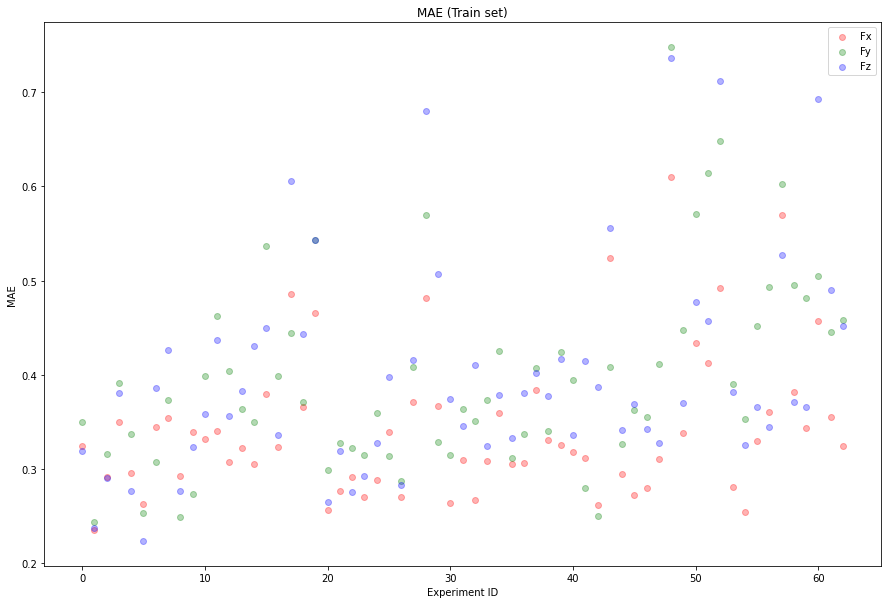

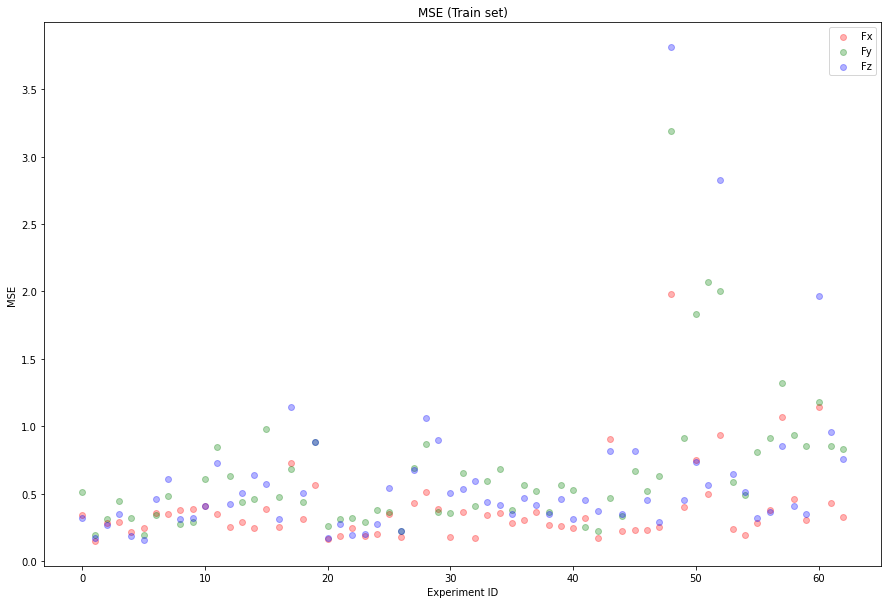

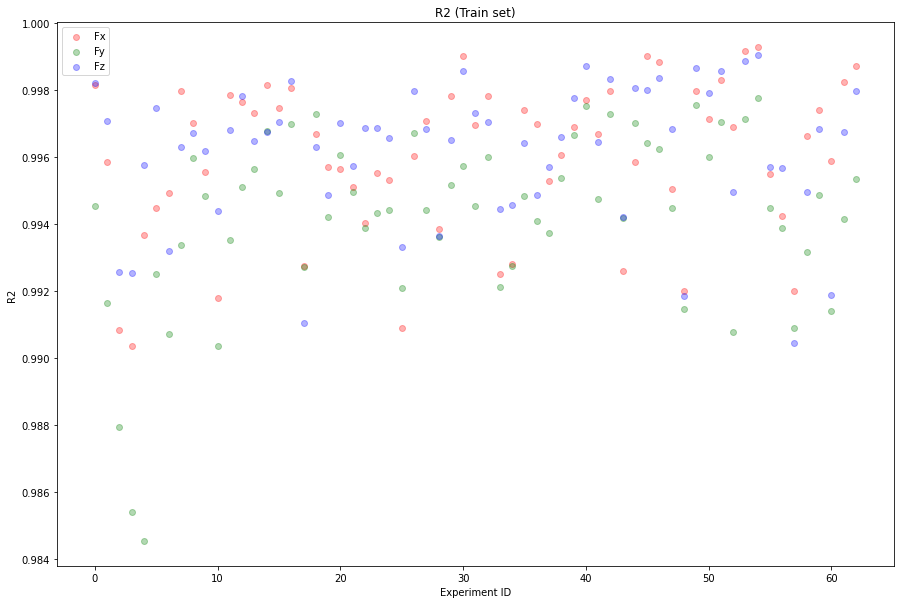

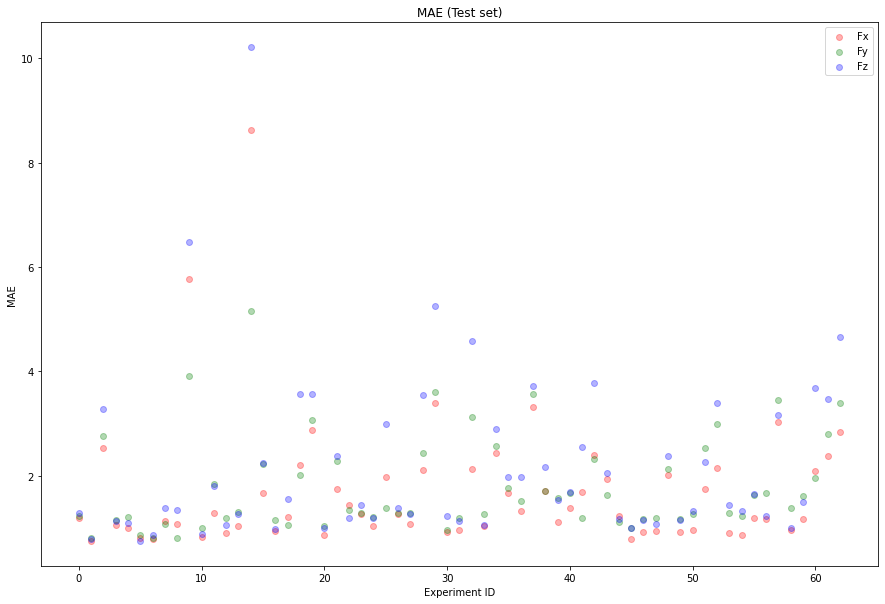

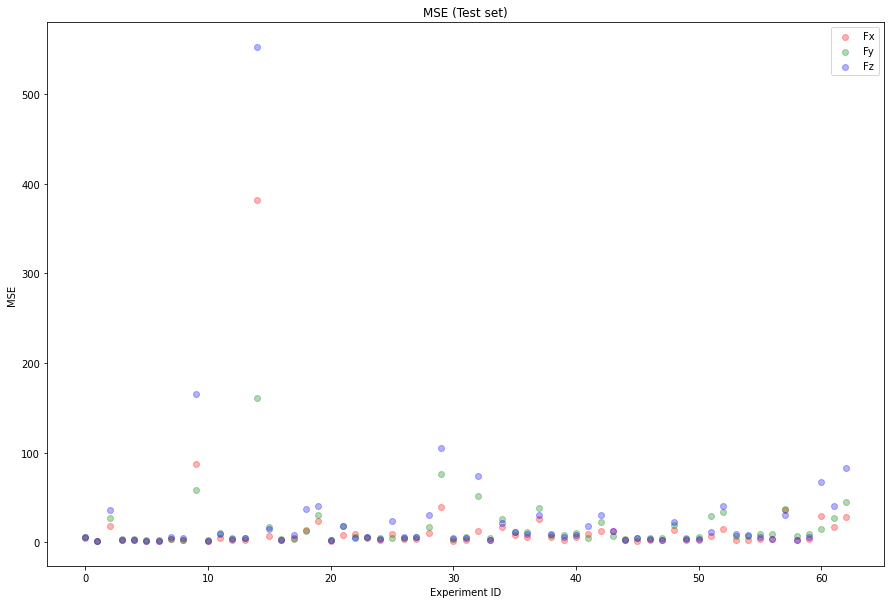

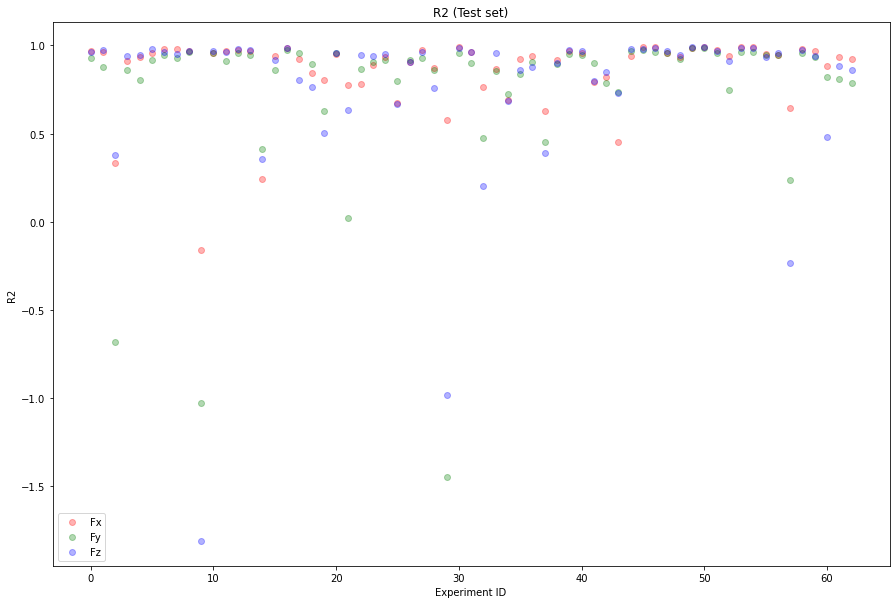

In [48]:
for subset in ['Train', 'Test']:
    for loss in ['MAE', 'MSE', 'R2']:
        plt.figure(figsize=(15, 10))
        plt.scatter(range(len(results_full[' '.join([subset, 'Fx', loss])])), results_full[' '.join([subset, 'Fx', loss])], label='Fx', c='r', alpha=0.3)
        plt.scatter(range(len(results_full[' '.join([subset, 'Fy', loss])])), results_full[' '.join([subset, 'Fy', loss])], label='Fy', c='g', alpha=0.3)
        plt.scatter(range(len(results_full[' '.join([subset, 'Fz', loss])])), results_full[' '.join([subset, 'Fz', loss])], label='Fz', c='b', alpha=0.3)
        plt.title('{} ({} set)'.format(loss, subset))
        plt.xlabel('Experiment ID')
        plt.ylabel(loss)
        plt.legend()
        plt.show()

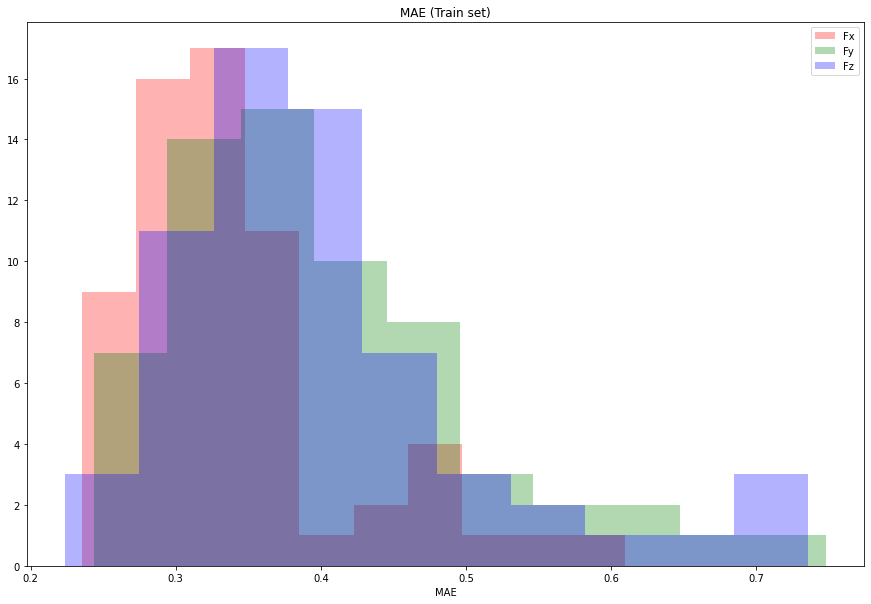

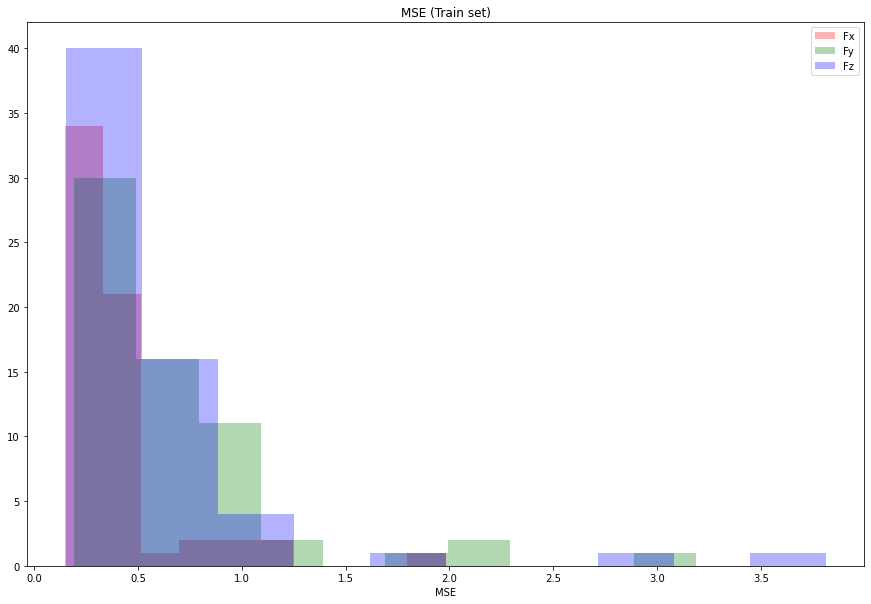

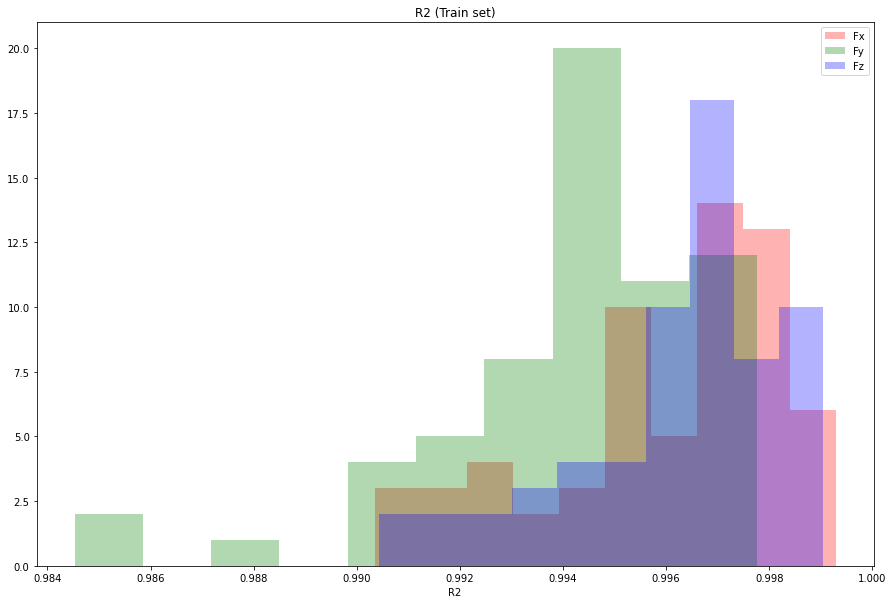

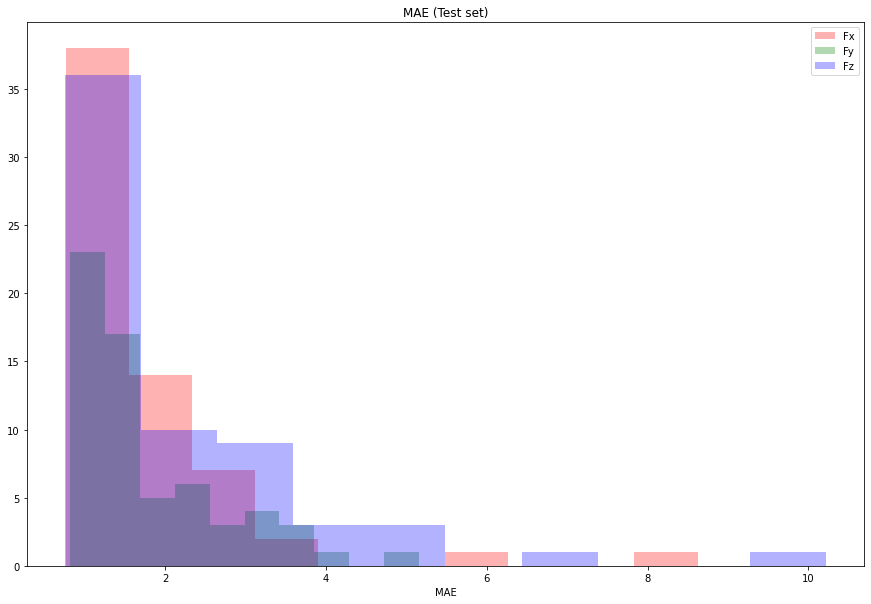

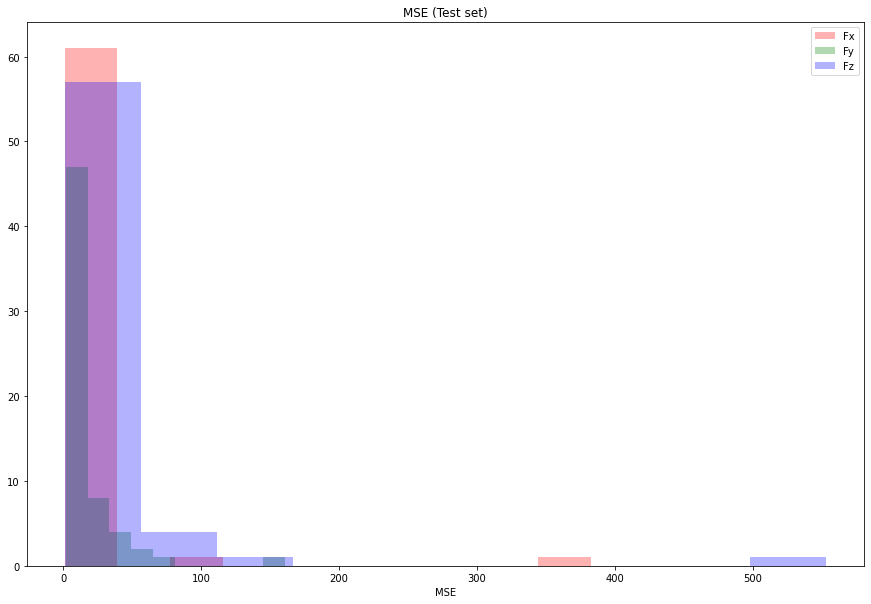

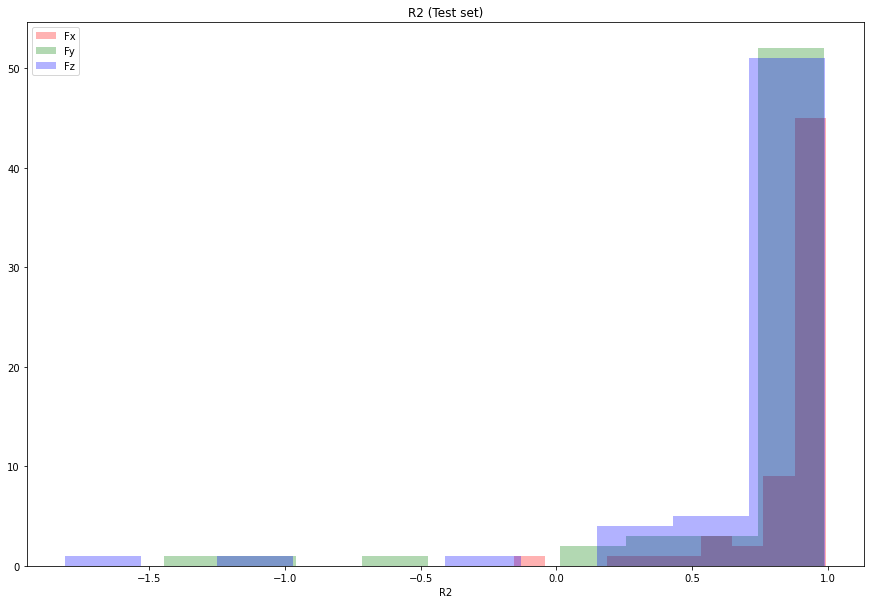

In [33]:
for subset in ['Train', 'Test']:
    for loss in ['MAE', 'MSE', 'R2']:
        plt.figure(figsize=(15, 10))
        plt.hist(results_full[' '.join([subset, 'Fx', loss])], label='Fx', color='r', alpha=0.3)
        plt.hist(results_full[' '.join([subset, 'Fy', loss])], label='Fy', color='g', alpha=0.3)
        plt.hist(results_full[' '.join([subset, 'Fz', loss])], label='Fz', color='b', alpha=0.3)
        plt.title('{} ({} set)'.format(loss, subset))
        plt.xlabel(loss)
        plt.legend()
        plt.show()

In [52]:
# Load some examples
targets_dict = {}
features_dict = {}
for i, exp_path in enumerate(experiments_dirs_path):
    #print(exp_path)
    # Load targets
    targets_df = pd.read_csv(exp_path + '/force_cells_processed.csv')

    # Load features
    features_df = pd.read_csv(exp_path + '/H3_processed.csv')

    # Drop first row to remove noise in the start of the data recording
    targets_df = targets_df.iloc[1:]
    features_df = features_df.iloc[1:]
    # Drop null values
    idx = features_df.notna().all(axis=1)
    features_df = features_df.loc[idx]
    targets_df = targets_df.loc[idx]
    #print('Droping {} data points by null features'.format(len(idx[idx == False])))

    assert(len(features_df) == len(targets_df))
    # Store the final array
    targets_dict[i] = targets_df[targets]
    features_dict[i] = features_df[features]

In [62]:
# Select the examples to plot  
examples_ls = [8, 9, 29, 30, 57, 58]

targets_dict_aux = {idx: df for idx, df in targets_dict.items() if idx in examples_ls}
features_dict_aux = {idx: df for idx, df in features_dict.items() if idx in examples_ls}

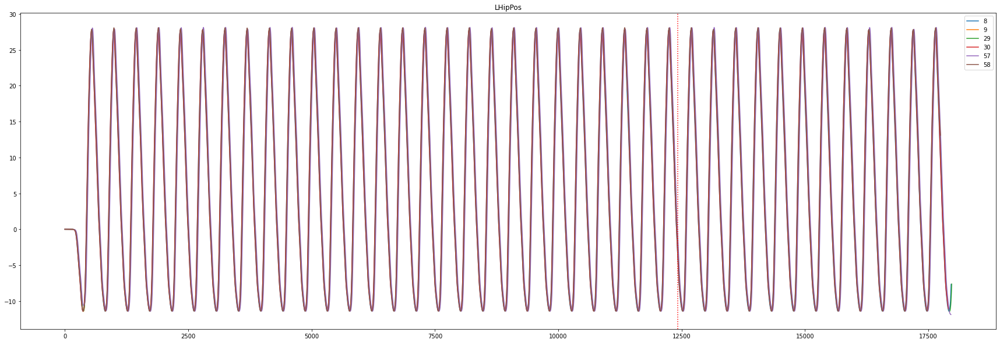

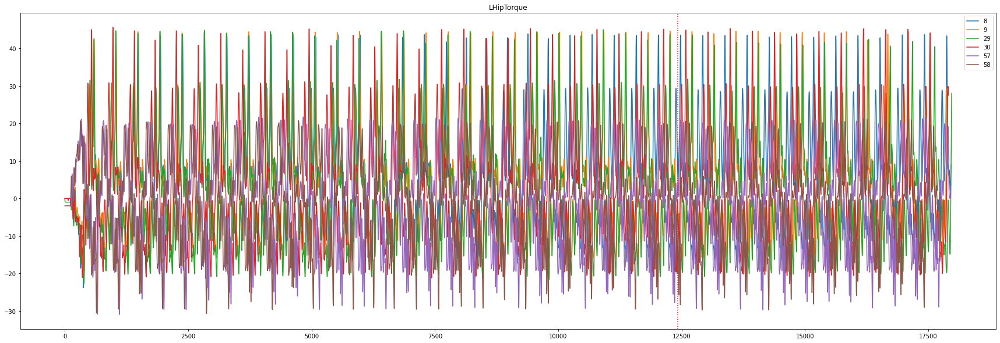

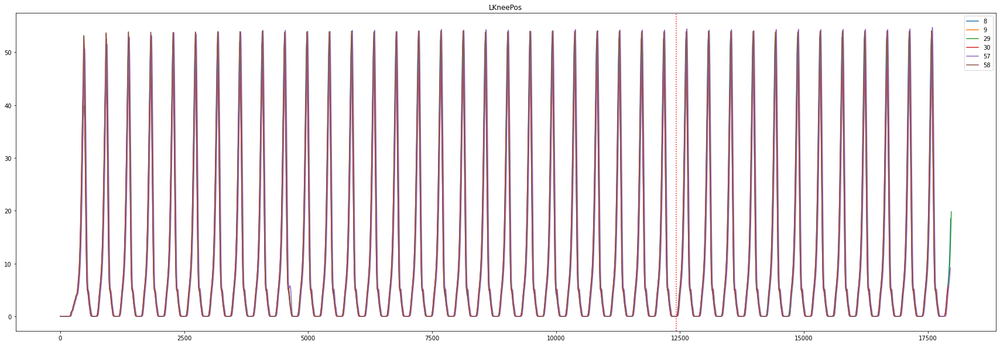

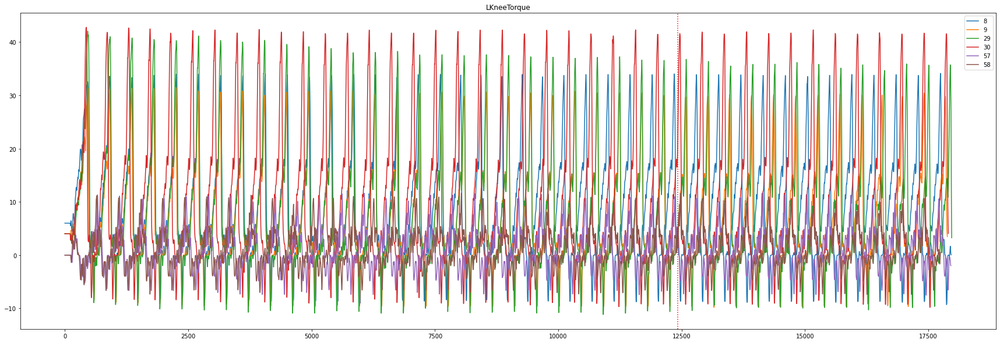

In [66]:
# Max data points to plot
max_dt = 10000

for feature in features:
    plt.figure(figsize=(30,10))
    for k, v in features_dict_aux.items():
        plt.plot(v[feature], label=str(k))
    plt.axvline(x=int(len(v) * (1 - TEST_SIZE)), c='r', linestyle=':')

    plt.title(feature)
    plt.legend()
    plt.show()

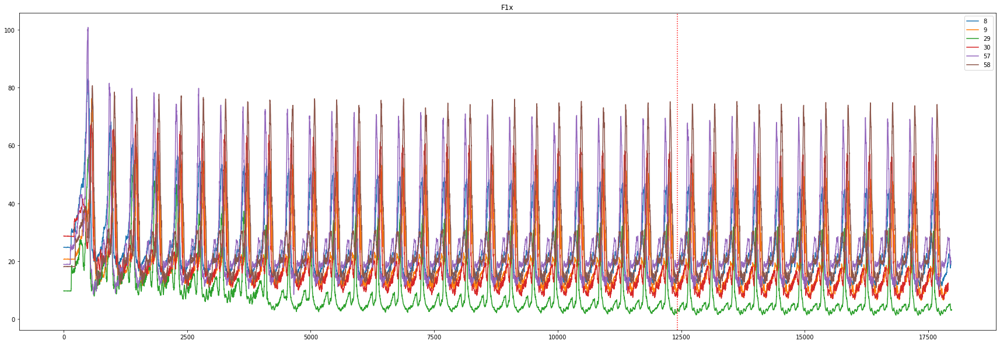

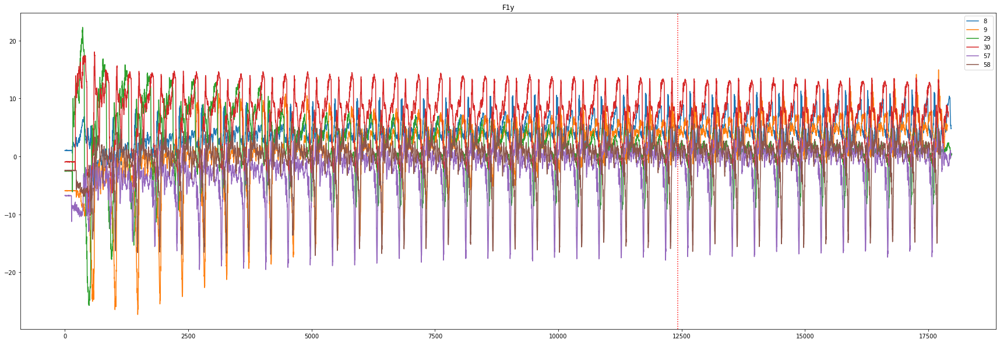

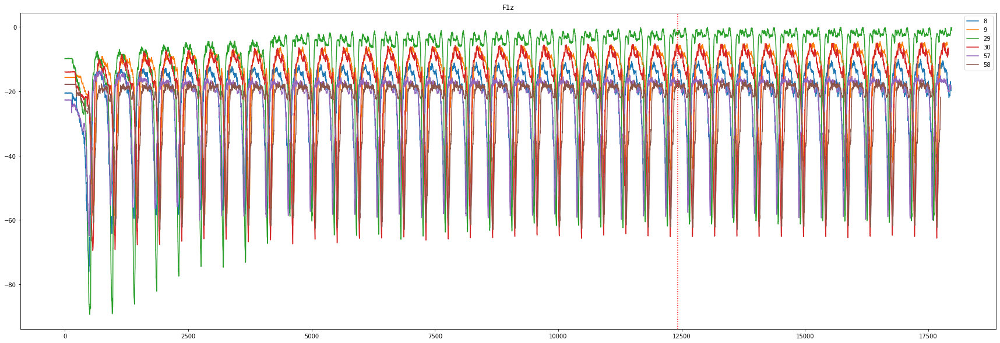

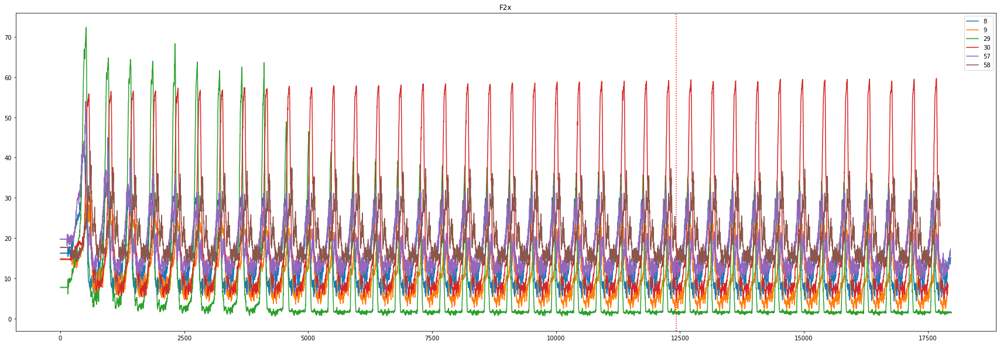

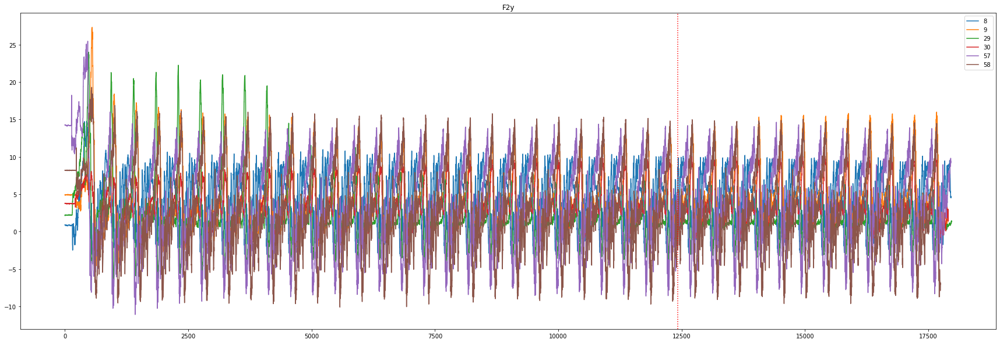

...

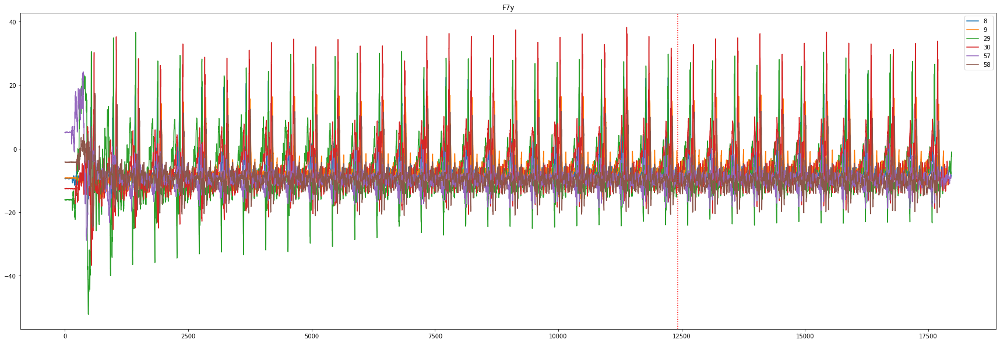

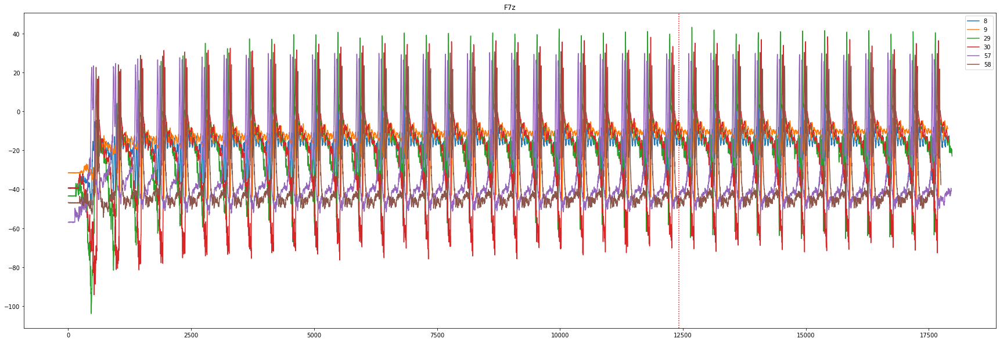

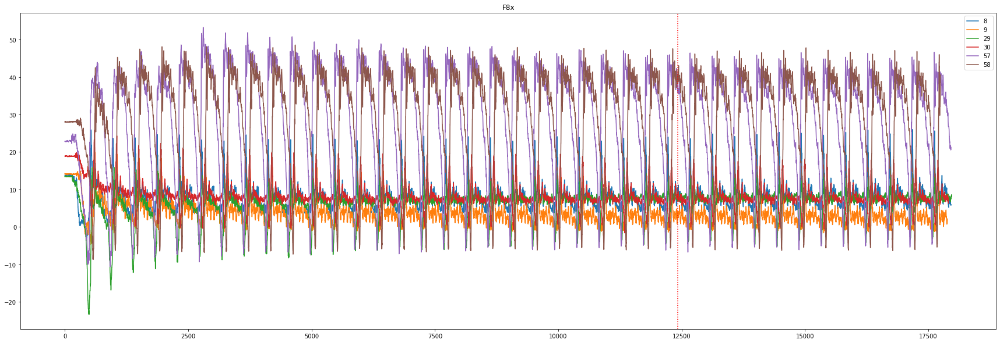

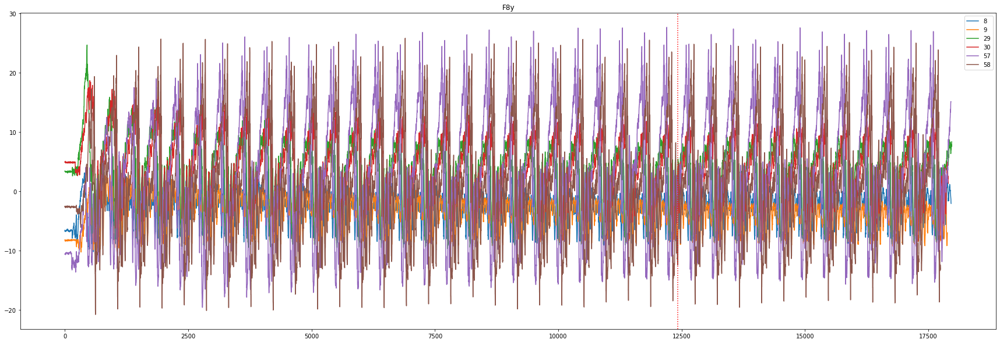

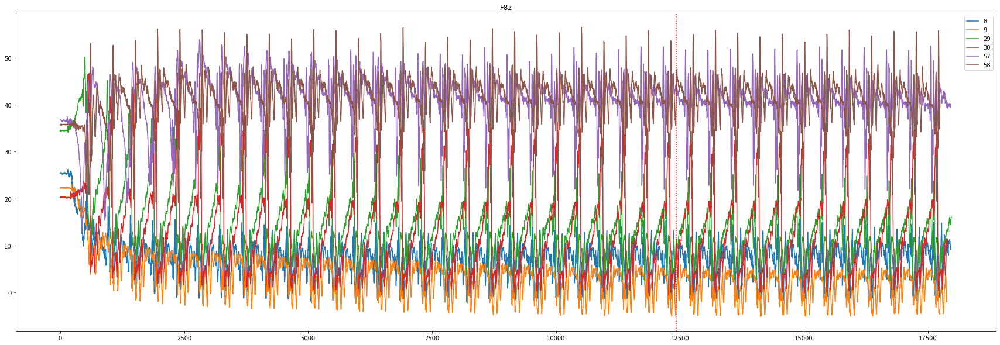

In [67]:
# Max data points to plot
max_dt = 10000

for target in targets:
    plt.figure(figsize=(30,10))
    for k, v in targets_dict_aux.items():
        plt.plot(v[target], label=str(k))
    plt.axvline(x=int(len(v) * (1 - TEST_SIZE)), c='r', linestyle=':')

    plt.title(target)
    plt.legend()
    plt.show()

# Baseline prediction of the data from the same experiment

Check that a basic prediction can be done. The aim of this sanity check is to ensure that the correlation between two features is enough to produce quality predictions. In this case, we are going to check if in the same experiment, the correlation between the exo knee position and the exo knee torque is enough.

In [59]:
feature = 'LKneePos'
target = 'LKneeTorque'

In [60]:
# Scaler to normalize the data
SCALER = MinMaxScaler() # StandardScaler()

# Percentage of the date for the test set
TEST_SIZE = 0.3

In [61]:
experiments_dirs_path = glob.glob(DERIVED_DATA_DIR + '/*/*')
exp_path = experiments_dirs_path[0]

print('Experiment: ' + exp_path)

Experiment: ../../../data/10032021/1


In [62]:
# Load features
data_df = pd.read_csv(exp_path + '/H3_processed.csv')

# Drop first row to remove noise in the start of the data recording
data_df = data_df.iloc[1:]
# Drop null values
idx = data_df.notna().all(axis=1)
data_df = data_df.loc[idx]
print('Droping {} data points by null features'.format(len(idx[idx == False])))

# Store the final array
feature_arr = data_df[feature].values
target_arr = data_df[target].values

print('X: {}, Y: {}'.format(feature_arr.shape, target_arr.shape))

Droping 2 data points by null features
X: (6072,), Y: (6072,)


In [66]:
idx_split = int(target_arr.shape[0] * (1 - TEST_SIZE))

X_train = feature_arr[:idx_split][:, np.newaxis]
X_test = feature_arr[idx_split:][:, np.newaxis]

Y_train = target_arr[:idx_split]
Y_test = target_arr[idx_split:]

print('Train -> X: {}, Y: {}'.format(X_train.shape, Y_train.shape))
print('Test -> X: {}, Y: {}'.format(X_test.shape, Y_test.shape))

Train -> X: (4250, 1), Y: (4250,)
Test -> X: (1822, 1), Y: (1822,)


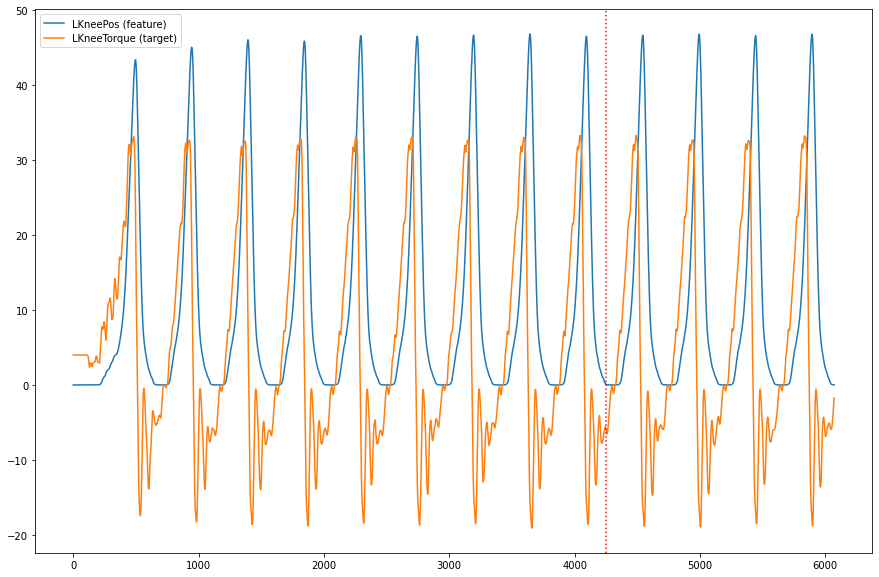

In [67]:
plt.figure(figsize=(15,10))
plt.plot(np.concatenate([X_train, X_test]), label='{} ({})'.format(feature, 'feature'))
plt.plot(np.concatenate([Y_train, Y_test]), label='{} ({})'.format(target, 'target'))
plt.axvline(x=idx_split, c='r', linestyle=':')
plt.legend()
plt.show()

In [64]:
s = SCALER.fit(X_train)

X_train = s.transform(X_train)
X_test = s.transform(X_test)

print('Train -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_train, axis=0), np.max(X_train, axis=0), np.mean(X_train, axis=0), np.std(X_train, axis=0)))
print('Test -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_test, axis=0), np.max(X_test, axis=0), np.mean(X_test, axis=0), np.std(X_test, axis=0)))

Train -> 
 min: [0.], 
 max: [1.], 
 mean: [0.22409571], 
 std: [0.29840276]

Test -> 
 min: [4.80148601e-06], 
 max: [0.99921221], 
 mean: [0.23321334], 
 std: [0.30534827]



In [28]:
# Setup the model
model = RandomForestRegressor(random_state=0, n_jobs=-1, verbose=0)

t_start = time.time()
model.fit(X_train, Y_train)
tr_time = time.time() - t_start
print('Training time: {:.4f}'.format(tr_time))

train_preds = model.predict(X_train)
test_preds = model.predict(X_test)

results = {
    'Train': {
        'MAE': mean_absolute_error(Y_train, train_preds),
        'MSE': mean_squared_error(Y_train, train_preds),
        'R2': r2_score(Y_train, train_preds)
    },
    'Test': {
        'MAE': mean_absolute_error(Y_test, test_preds),
        'MSE': mean_squared_error(Y_test, test_preds),
        'R2': r2_score(Y_test, test_preds)
    }       
    
}

# Display the score mean and standard deviation of each axis
for subset in ['Train', 'Test']:
    for loss in ['MAE', 'MSE', 'R2']:
        print(' '.join([subset, loss]) + ': {:.4f}'.format(results[subset][loss]))


Training time: 0.2445
Train MAE: 2.6767
Train MSE: 20.0729
Train R2: 0.8998
Test MAE: 6.8684
Test MSE: 120.3858
Test R2: 0.4257


In [47]:
results_full = defaultdict(list)

for exp_path in experiments_dirs_path:
    print(exp_path)
    
    # Load features
    data_df = pd.read_csv(exp_path + '/H3_processed.csv')

    # Drop first row to remove noise in the start of the data recording
    data_df = data_df.iloc[1:]
    # Drop null values
    idx = data_df.notna().all(axis=1)
    data_df = data_df.loc[idx]
    print('Droping {} data points by null features'.format(len(idx[idx == False])))

    # Store the final array
    feature_arr = data_df[feature].values
    target_arr = data_df[target].values

    print('X: {}, Y: {}'.format(feature_arr.shape, target_arr.shape))

    idx_split = int(target_arr.shape[0] * (1 - TEST_SIZE))

    X_train = feature_arr[:idx_split][:, np.newaxis]
    X_test = feature_arr[idx_split:][:, np.newaxis]

    Y_train = target_arr[:idx_split]
    Y_test = target_arr[idx_split:]

    print('Train -> X: {}, Y: {}'.format(X_train.shape, Y_train.shape))
    print('Test -> X: {}, Y: {}'.format(X_test.shape, Y_test.shape))

    s = SCALER.fit(X_train)

    X_train = s.transform(X_train)
    X_test = s.transform(X_test)

    print('Train -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_train, axis=0), np.max(X_train, axis=0), np.mean(X_train, axis=0), np.std(X_train, axis=0)))
    print('Test -> \n min: {}, \n max: {}, \n mean: {}, \n std: {}\n'.format(np.min(X_test, axis=0), np.max(X_test, axis=0), np.mean(X_test, axis=0), np.std(X_test, axis=0)))

    # Setup the model
    model = RandomForestRegressor(random_state=0, n_jobs=-1, verbose=0)

    t_start = time.time()
    model.fit(X_train, Y_train)
    tr_time = time.time() - t_start
    print('Training time: {:.4f}'.format(tr_time))

    train_preds = model.predict(X_train)
    test_preds = model.predict(X_test)

    results = {
        'Train': {
            'MAE': mean_absolute_error(Y_train, train_preds),
            'MSE': mean_squared_error(Y_train, train_preds),
            'R2': r2_score(Y_train, train_preds)
        },
        'Test': {
            'MAE': mean_absolute_error(Y_test, test_preds),
            'MSE': mean_squared_error(Y_test, test_preds),
            'R2': r2_score(Y_test, test_preds)
        }       

    }

    # Display the score mean and standard deviation of each axis
    for subset in ['Train', 'Test']:
        for loss in ['MAE', 'MSE', 'R2']:
            print(' '.join([subset, loss]) + ': {:.4f}'.format(results[subset][loss]))
            results_full[' '.join([subset, loss])].append(results[subset][loss])

../../../data/10032021/1
Droping 2 data points by null features
X: (6072,), Y: (6072,)
Train -> X: (4250, 1), Y: (4250,)
Test -> X: (1822, 1), Y: (1822,)
Train -> 
 min: [0.], 
 max: [1.], 
 mean: [0.22409571], 
 std: [0.29840276]

Test -> 
 min: [4.80148601e-06], 
 max: [0.99921221], 
 mean: [0.23321334], 
 std: [0.30534827]

Training time: 0.3329
Train MAE: 2.6773
Train MSE: 20.0799
Train R2: 0.8998
Test MAE: 6.8647
Test MSE: 120.3050
Test R2: 0.4259
../../../data/16022021/1
Droping 0 data points by null features
X: (17907,), Y: (17907,)
Train -> X: (12534, 1), Y: (12534,)
Test -> X: (5373, 1), Y: (5373,)
Train -> 
 min: [0.], 
 max: [1.], 
 mean: [0.21073552], 
 std: [0.29358762]

Test -> 
 min: [-4.41328245e-05], 
 max: [1.00251344], 
 mean: [0.21733482], 
 std: [0.29750766]

Training time: 1.0803
Train MAE: 2.3933
Train MSE: 12.2918
Train R2: 0.8361
Test MAE: 4.8216
Test MSE: 48.8929
Test R2: 0.3646
../../../data/16022021/2
Droping 0 data points by null features
X: (17875,), Y: (1

In [48]:
# Display the score mean and standard deviation of each axis
for subset in ['Train', 'Test']:
    for loss in ['MAE', 'MSE', 'R2']:
        scores = results_full[' '.join([subset, loss])]
        s_mean = np.mean(scores)
        s_median = np.median(scores)
        s_std = np.std(scores)

        print(' '.join([subset, force, loss]) + ': {:.4f} ± {:.4f}'.format(s_mean, s_std))            
        print(' '.join([subset, force, loss, '(median)']) + ': {:.4f}'.format(s_median))

Train Fx MAE: 1.8196 ± 0.8348
Train Fx MAE (median): 1.6585
Train Fx MSE: 9.7947 ± 8.0894
Train Fx MSE (median): 7.1407
Train Fx R2: 0.8739 ± 0.0699
Train Fx R2 (median): 0.8880
Test Fx MAE: 6.5355 ± 3.2222
Test Fx MAE (median): 6.2207
Test Fx MSE: 100.4738 ± 79.1067
Test Fx MSE (median): 97.6696
Test Fx R2: -0.1706 ± 0.5678
Test Fx R2 (median): -0.0544


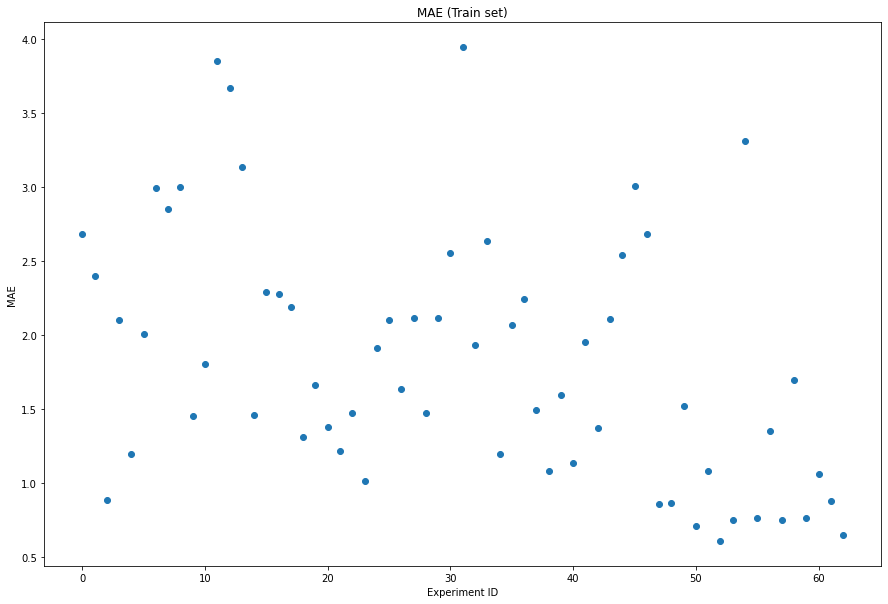

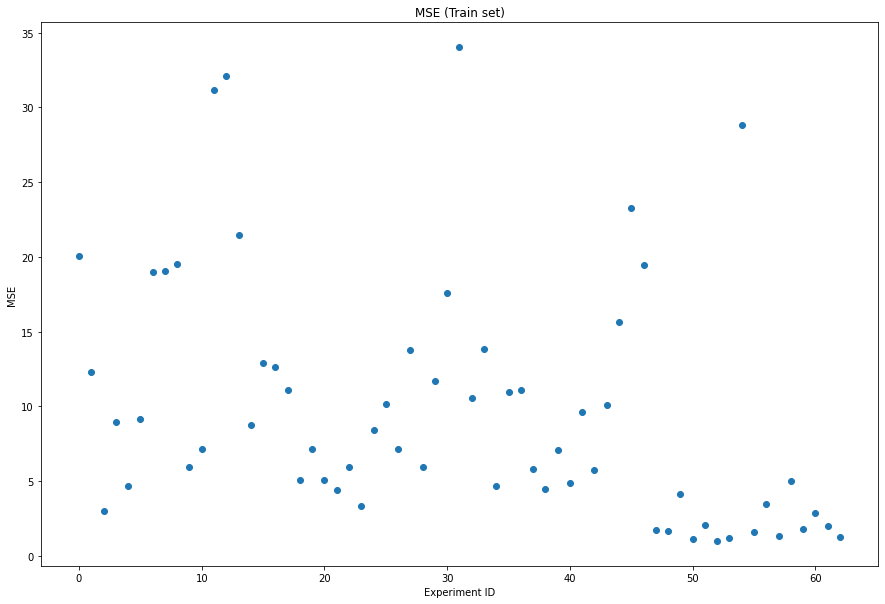

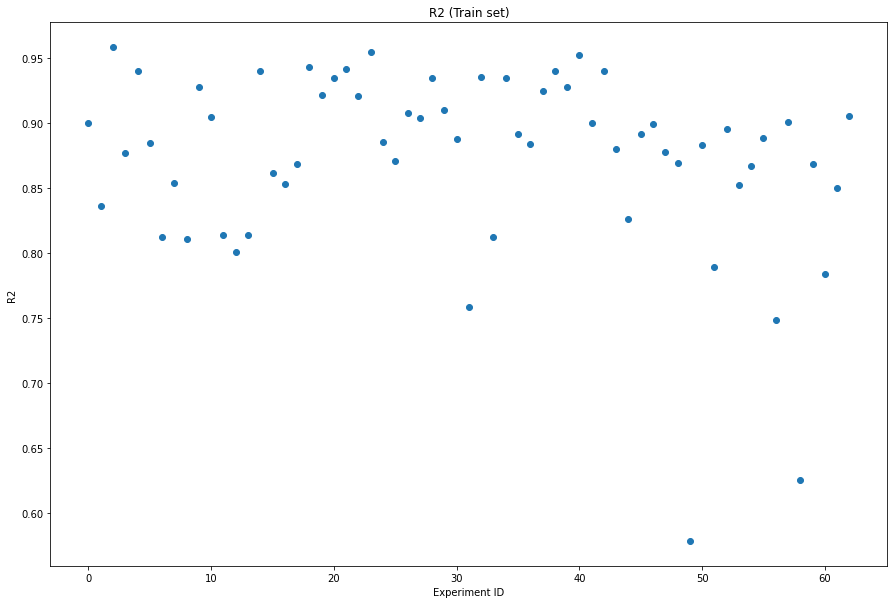

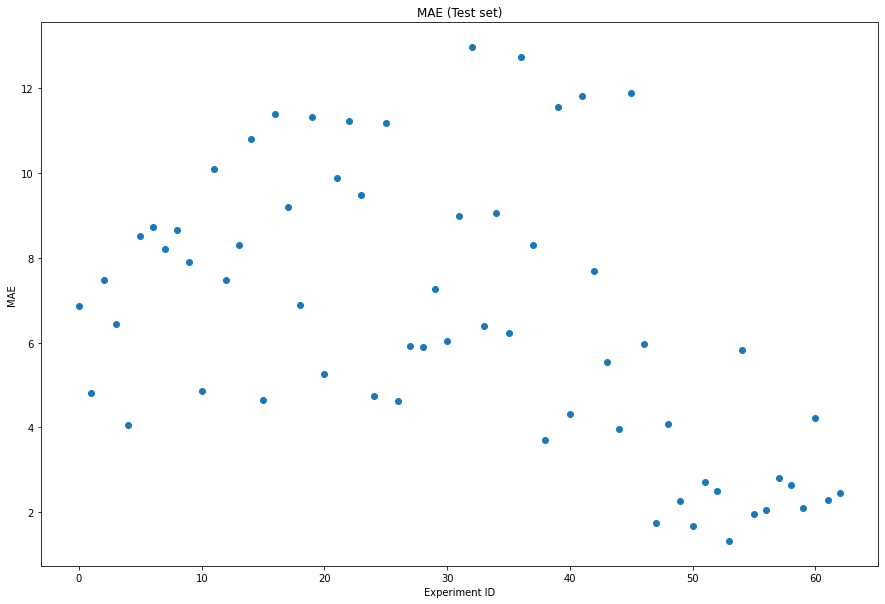

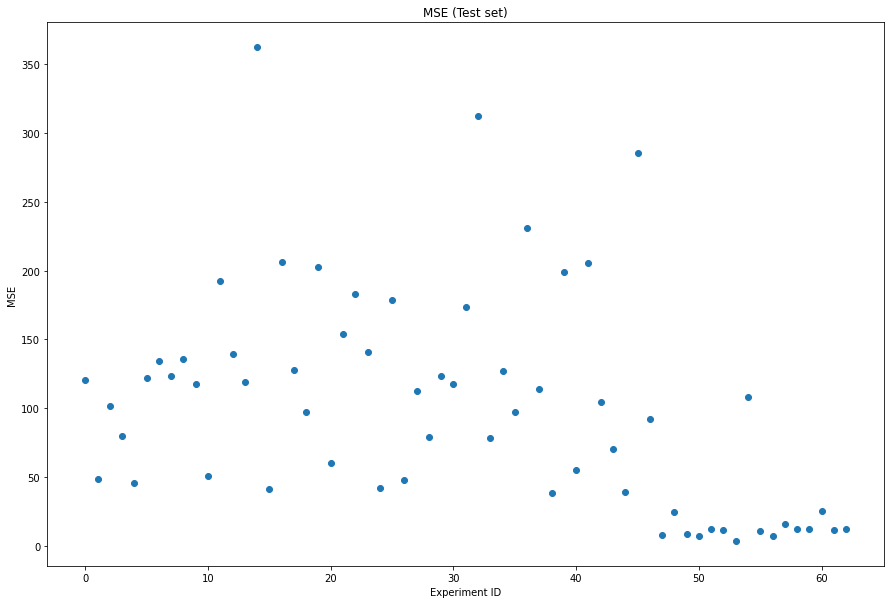

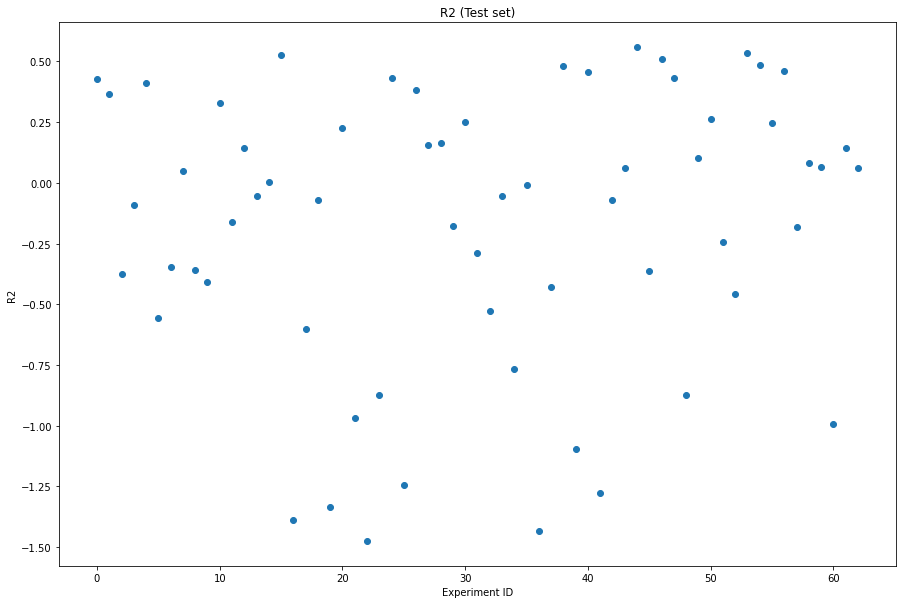

In [50]:
for subset in ['Train', 'Test']:
    for loss in ['MAE', 'MSE', 'R2']:
        plt.figure(figsize=(15, 10))
        plt.scatter(range(len(results_full[' '.join([subset, loss])])), results_full[' '.join([subset, loss])])
        plt.title('{} ({} set)'.format(loss, subset))
        plt.xlabel('Experiment ID')
        plt.ylabel(loss)
        plt.show()

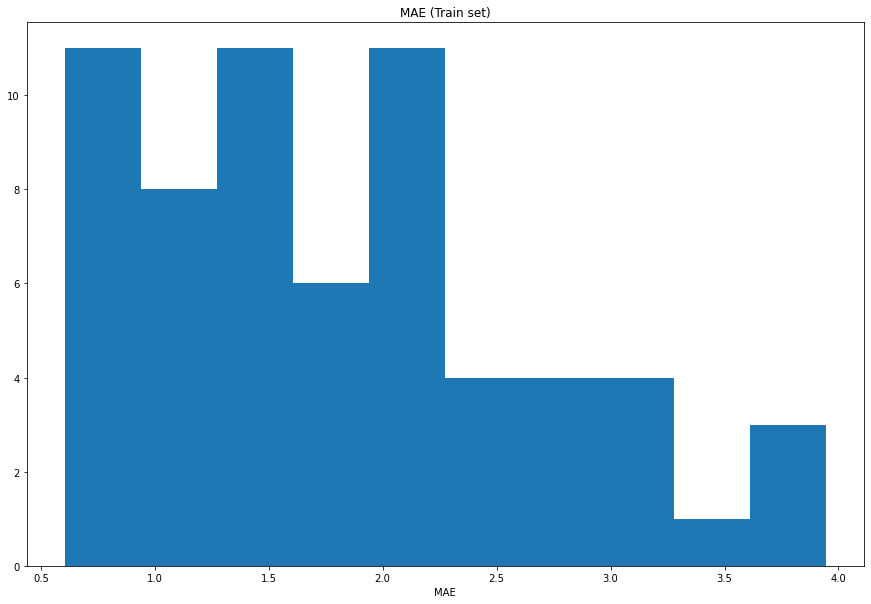

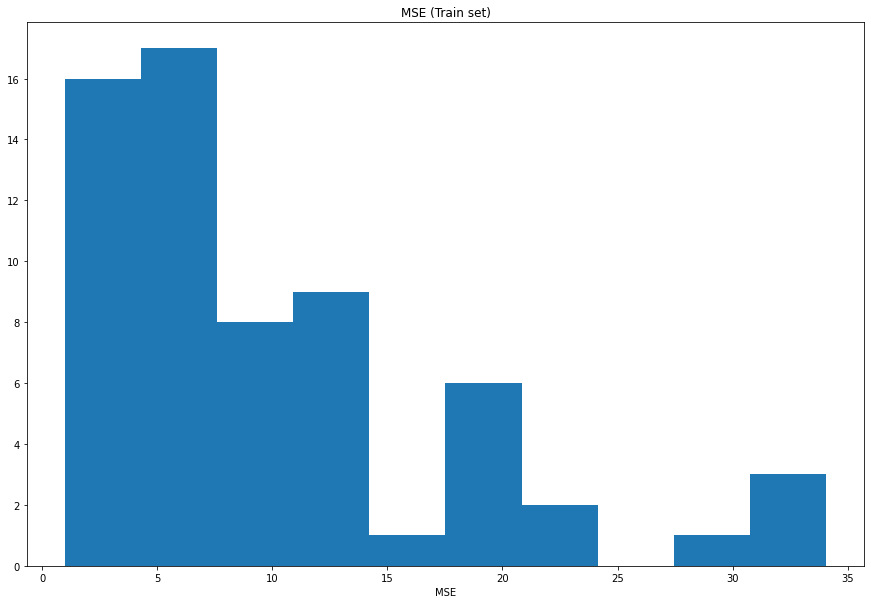

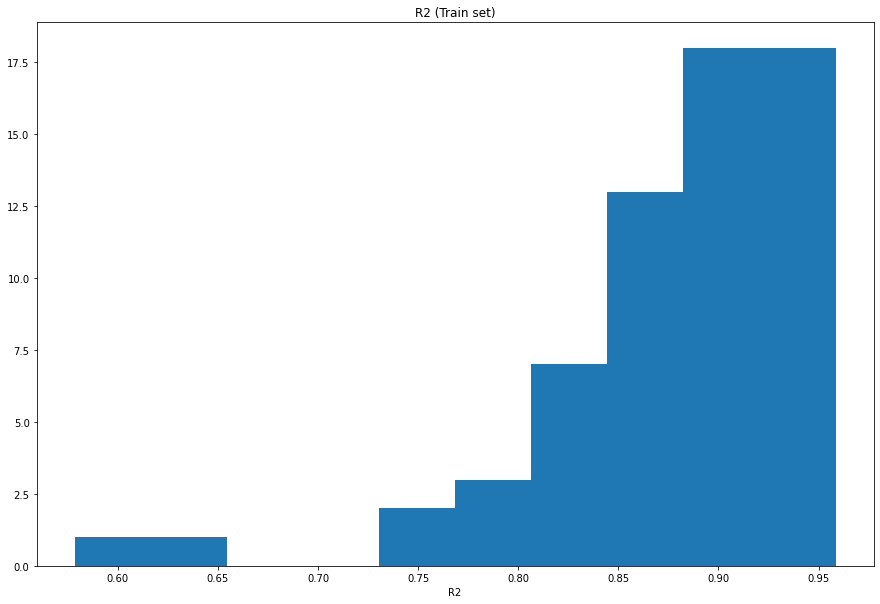

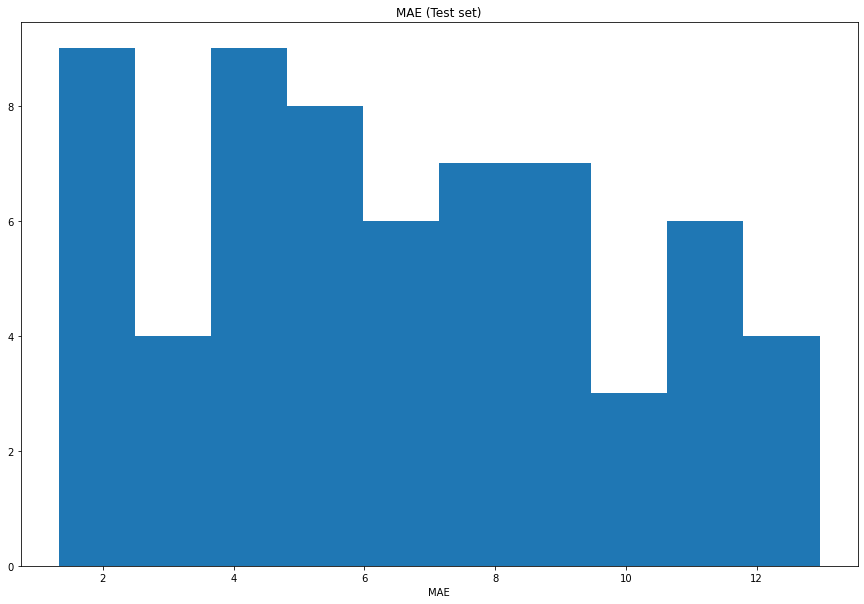

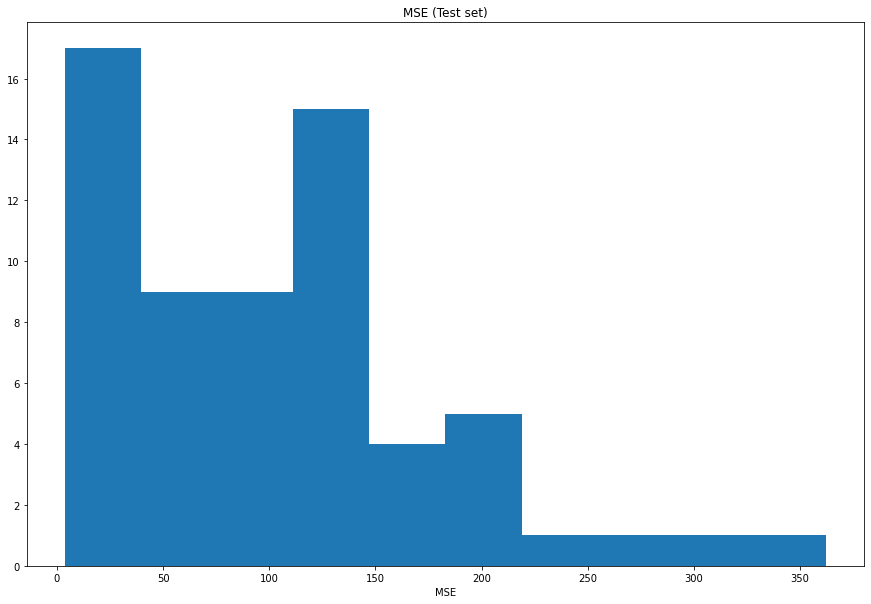

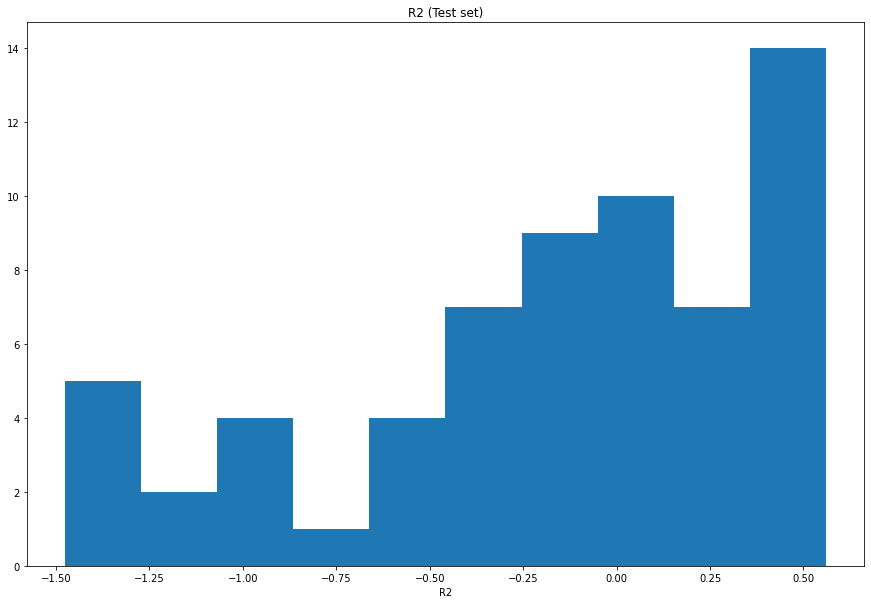

In [52]:
for subset in ['Train', 'Test']:
    for loss in ['MAE', 'MSE', 'R2']:
        plt.figure(figsize=(15, 10))
        plt.hist(results_full[' '.join([subset, loss])])
        plt.title('{} ({} set)'.format(loss, subset))
        plt.xlabel(loss)
        plt.show()

In [53]:
# Load some examples
targets_dict = {}
features_dict = {}
for i, exp_path in enumerate(experiments_dirs_path):
    # Load features
    data_df = pd.read_csv(exp_path + '/H3_processed.csv')

    # Drop first row to remove noise in the start of the data recording
    data_df = data_df.iloc[1:]
    # Drop null values
    idx = data_df.notna().all(axis=1)
    data_df = data_df.loc[idx]
    print('Droping {} data points by null features'.format(len(idx[idx == False])))

    # Store the final array
    features_dict[i] = data_df[feature].values
    targets_dict[i] = data_df[target].values

Droping 2 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by null features
Droping 0 data points by 

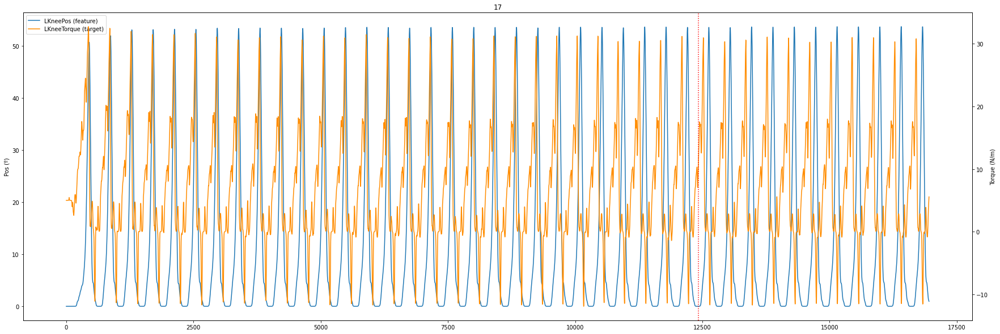

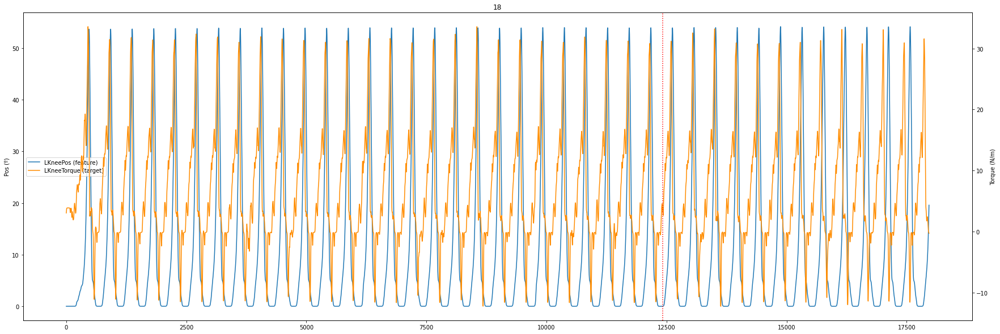

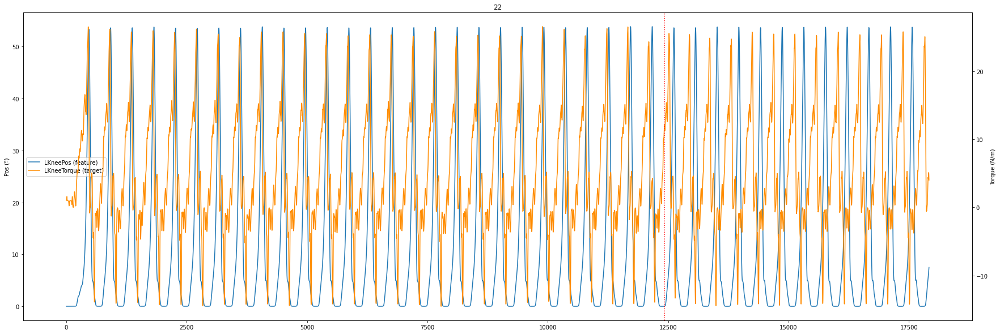

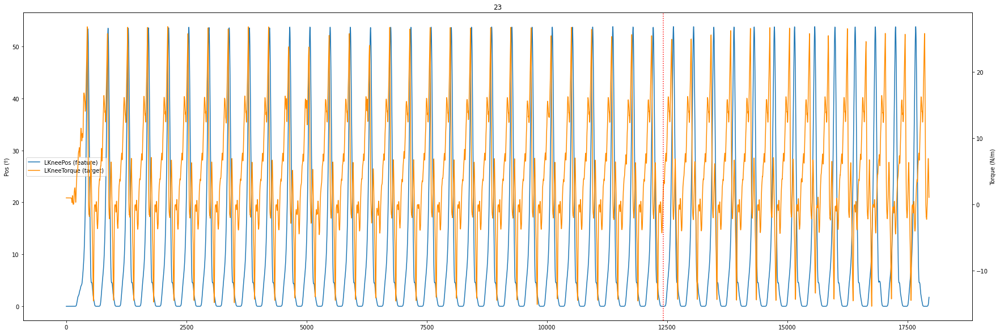

In [74]:
# Select the examples to plot  
examples_ls = [17, 18, 22, 23]

for e in examples_ls:
    fig, ax1 = plt.subplots(figsize=(30,10))
    
    ax2 = ax1.twinx()
    lns1 = ax1.plot(features_dict[e], label='{} ({})'.format(feature, 'feature'))
    lns2 = ax2.plot(targets_dict[e], label='{} ({})'.format(target, 'target'), c='darkorange')
    plt.axvline(x=int(len(v) * (1 - TEST_SIZE)), c='r', linestyle=':')
    
    plt.title(str(e))
    ax1.set_ylabel('Pos (º)')
    ax2.set_ylabel('Torque (N/m)')
    
    lns = lns1 + lns2
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs)
    
    plt.show()